## Earthquake forecasting using machine learning.
#### By Ghanshyam Kumar Mahato for Dissertation.

# 1: Import all the required library


### Here I'm importing all the libraries that are required for this project.

In [2]:
import numpy as np
import pandas as pd
import requests
from datetime import datetime
import seaborn as sns
import matplotlib.pyplot as plt
import squarify
import plotly.express as px
# for plotting on world map 
from plotly.express import scatter_geo
import sys
import warnings
warnings.filterwarnings("ignore")
from mpl_toolkits.mplot3d import Axes3D

In [2]:
#creating the function which will read csv files from the local drive after calling and passing the path of the file.
def read_csv(path):
    return pd.read_csv(path)


In [3]:
#reading the dataset from the local drive by calling the function read_csv(). 
# and also printing first five rows of the dataframe.

earthquake_data = read_csv('../dataset/final_dataset/final_dataset.csv')

earthquake_data.head(10)

,Unnamed: 0,time,latitude,longitude,depth,mag,magType,nst,gap,dmin,...,depthError,magError,magNst,status,locationSource,magSource,distance,url,gravity,force
0,20,2011-01-01 09:56:58,-26.803,-63.136,576.8,7.00,mww,607.0,18.4,NaN,...,NaN,NaN,NaN,reviewed,us,us,380543,https://geodesy.noaa.gov/api/gravd/gp?lat=-26....,9.818623,2.021809e+20
1,21,2011-01-01 09:59:36,-26.851,-63.217,592.9,5.78,mw,NaN,NaN,NaN,...,25.0,0.4,NaN,reviewed,iscgem,iscgem,380548,https://geodesy.noaa.gov/api/gravd/gp?lat=-26....,9.794050,2.021755e+20
2,76,2011-01-02 09:23:13,-59.414,-24.469,35.0,5.10,mb,52.0,95.5,NaN,...,NaN,NaN,13.0,reviewed,us,us,383580,https://geodesy.noaa.gov/api/gravd/gp?lat=-59....,9.793398,1.989920e+20
3,92,2011-01-02 15:19:31,-4.458,101.428,21.6,5.70,mwb,271.0,28.9,NaN,...,3.2,NaN,NaN,reviewed,us,us,384394,https://geodesy.noaa.gov/api/gravd/gp?lat=-4.4...,9.802458,1.981501e+20
4,103,2011-01-02 20:20:17,-38.355,-73.326,24.0,7.20,mww,397.0,30.1,NaN,...,NaN,NaN,NaN,reviewed,us,us,385093,https://geodesy.noaa.gov/api/gravd/gp?lat=-38....,9.790649,1.974314e+20
5,170,2011-01-03 16:43:28,-59.791,149.897,10.0,5.60,mwc,50.0,74.5,NaN,...,NaN,NaN,NaN,reviewed,us,gcmt,388038,https://geodesy.noaa.gov/api/gravd/gp?lat=-59....,9.812433,1.944460e+20
6,190,2011-01-03 23:10:15,-41.164,-90.871,10.0,5.30,mwc,19.0,95.7,NaN,...,NaN,NaN,NaN,reviewed,us,gcmt,388996,https://geodesy.noaa.gov/api/gravd/gp?lat=-41....,9.791726,1.934894e+20
7,200,2011-01-04 05:54:02,-16.038,-173.100,26.8,5.30,mwc,198.0,66.9,NaN,...,NaN,NaN,NaN,reviewed,us,gcmt,390006,https://geodesy.noaa.gov/api/gravd/gp?lat=-16....,9.788513,1.924886e+20
8,202,2011-01-04 06:06:04,-52.080,139.505,16.3,5.40,mwc,54.0,66.8,NaN,...,35.3,NaN,NaN,reviewed,us,gcmt,390036,https://geodesy.noaa.gov/api/gravd/gp?lat=-52....,9.780789,1.924590e+20
9,221,2011-01-04 18:17:36,-44.271,-15.778,10.0,5.10,mwc,15.0,76.8,NaN,...,NaN,NaN,NaN,reviewed,us,gcmt,391876,https://geodesy.noaa.gov/api/gravd/gp?lat=-44....,9.800852,1.906559e+20


In [4]:
# # Shape is the method which shows the dimension of the dataFrame.
earthquake_data.shape


(18059, 27)

In [5]:
# by using type() function of the pandas we can check type of dataframe object
type(earthquake_data)

pandas.core.frame.DataFrame

## 2: Data Visualization

In [6]:
#Droping the 'Unnamed 0' column this is index which was created while concatenating several csv datasets.
earthquake_data = earthquake_data.drop(['Unnamed: 0',], axis=1)

In [7]:
# The total entries in the dataset, both missing and present values of the dataframe.
earthquake_data.size

469534

In [8]:
# Total memory occupied and datatypes present in DataFrame.
# sys.getsizeof(earthquake_data)
earthquake_data.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18059 entries, 0 to 18058
Data columns (total 26 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   time             18059 non-null  object 
 1   latitude         18059 non-null  float64
 2   longitude        18059 non-null  float64
 3   depth            18059 non-null  float64
 4   mag              18059 non-null  float64
 5   magType          18059 non-null  object 
 6   nst              6873 non-null   float64
 7   gap              17816 non-null  float64
 8   dmin             13823 non-null  float64
 9   rms              17850 non-null  float64
 10  net              18059 non-null  object 
 11  id               18059 non-null  object 
 12  updated          18059 non-null  object 
 13  place            18059 non-null  object 
 14  type             18059 non-null  object 
 15  horizontalError  12645 non-null  float64
 16  depthError       15863 non-null  float64
 17  magError    

In [9]:
# Creating a dictionary to rename columns for better understanding the dataset. And checking for the name correction, upper-lower case correction etc.
col = {'time':'date_time',
 'latitude' :'latitude',
 'longitude':'longitude',
 'depth': 'depth',
 'mag': 'magnitude',
 'magType':'magnitude_type',
 'nst':'nst',
 'gap':'gap',
 'dmin':'depth_min',
 'rms':'rms',
 'net':'net',
 'id':'id',
 'updated':'updated_date',
 'place':'place',
 'type':'type',
 'horizontalError': 'horizontal_error',
 'depthError':'depth_error',
 'magError':'magnitude_error',
 'magNst':'magnitude_nst',
 'status':'status',
 'locationSource':'location_source',
 'magSource':'magnitude_source',
 'distance': 'distance',
 'gravity': 'gravity'
      }



In [10]:
#To correct the column names to lowercase for convenience, passing 'col' dictionary.

earthquake_data = earthquake_data.rename(columns=col)
#Result
earthquake_data.columns.tolist()

['date_time',
 'latitude',
 'longitude',
 'depth',
 'magnitude',
 'magnitude_type',
 'nst',
 'gap',
 'depth_min',
 'rms',
 'net',
 'id',
 'updated_date',
 'place',
 'type',
 'horizontal_error',
 'depth_error',
 'magnitude_error',
 'magnitude_nst',
 'status',
 'location_source',
 'magnitude_source',
 'distance',
 'url',
 'gravity',
 'force']

In [11]:
# checking the datatype of the column date_time
print(earthquake_data['date_time'].info())
#  Format of the date time 
earthquake_data['date_time'].iloc[0]

<class 'pandas.core.series.Series'>
RangeIndex: 18059 entries, 0 to 18058
Series name: date_time
Non-Null Count  Dtype 
--------------  ----- 
18059 non-null  object
dtypes: object(1)
memory usage: 141.2+ KB
None


'2011-01-01 09:56:58'

In [12]:
#Panda to_datatime function is usefully tool that is helpfully in changing date time format.
earthquake_data['date_time'] = pd.to_datetime(earthquake_data['date_time'])
earthquake_data['force'] = (6.67e-11 * 6.67e-11 * 7.35e22)/((earthquake_data['distance']*1000)**2)

In [13]:
# Labels were available from 2011 to 2024-feb, and the dataset is not organized by time and date, so let's do that by sorting the dataset by ascending order.
earthquake_data = earthquake_data.sort_values(by='date_time', ascending=True,)

earthquake_data.head(2)

,date_time,latitude,longitude,depth,magnitude,magnitude_type,nst,gap,depth_min,rms,...,depth_error,magnitude_error,magnitude_nst,status,location_source,magnitude_source,distance,url,gravity,force
0,2011-01-01 09:56:58,-26.803,-63.136,576.8,7.00,mww,607.0,18.4,NaN,0.85,...,NaN,NaN,NaN,reviewed,us,us,380543,https://geodesy.noaa.gov/api/gravd/gp?lat=-26....,9.818623,2.258039e-15
1,2011-01-01 09:59:36,-26.851,-63.217,592.9,5.78,mw,NaN,NaN,NaN,NaN,...,25.0,0.4,NaN,reviewed,iscgem,iscgem,380548,https://geodesy.noaa.gov/api/gravd/gp?lat=-26....,9.794050,2.257980e-15


In [14]:
# Creating 6 more distinct features like year, months, day, day_name, minutes etc., for exploration of the dataset

earthquake_data['year'] = earthquake_data['date_time'].dt.year
earthquake_data['month'] = earthquake_data['date_time'].dt.month
earthquake_data['day'] = earthquake_data['date_time'].dt.day
earthquake_data['hour'] = earthquake_data['date_time'].dt.hour
earthquake_data['minutes'] = earthquake_data['date_time'].dt.day
earthquake_data['day_name'] = earthquake_data['date_time'].dt.day_name()
earthquake_data.columns

Index(['date_time', 'latitude', 'longitude', 'depth', 'magnitude',
       'magnitude_type', 'nst', 'gap', 'depth_min', 'rms', 'net', 'id',
       'updated_date', 'place', 'type', 'horizontal_error', 'depth_error',
       'magnitude_error', 'magnitude_nst', 'status', 'location_source',
       'magnitude_source', 'distance', 'url', 'gravity', 'force', 'year',
       'month', 'day', 'hour', 'minutes', 'day_name'],
      dtype='object')

Columns catalog.

1. date_time: Date and Time when the earthquake event was occured.
2. latitude: The geographical latitude (in degrees) where the earthquake occurred.
3. longitude: The geographical longitude (in degrees) where the earthquake occurred.
4. depth: The depth (in kilometers) at which the earthquake occurred below the Earth's surface.
5. magnitude: Magnitude of the earthquake event.
6. magnitude_type: Type of magnitude measurement used (e.g., "ML" for local magnitude, "MW" for moment magnitude).
7. nst: Number of seismic stations that contributed to the earthquake magnitude determination.
8. gap: The azimuthal gap (in degrees) of seismic stations used in determining earthquake magnitude.
9. depth_min: The minimum distance (in degrees) to the nearest station that reported the earthquake.
10. rms: Root mean square (RMS) of the residual travel time (in seconds) between observed and predicted arrivals.
11. net: The seismic network associated with the earthquake data.
12. id: Unique identifier for the earthquake event.
13. updated_date: Time when the earthquake event data was last updated.
14. place: Location description or name where the earthquake occurred.
15. type: Type of seismic event (e.g., "earthquake," "explosion").
16. horizontal_error: Horizontal error (in kilometers) associated with the location of the earthquake.
17. depth_error: Depth error (in kilometers) associated with the depth of the earthquake.
18. magnitude_error: Magnitude error associated with the earthquake magnitude measurement.
19. magnitude_nst: Number of seismic stations used in determining the earthquake magnitude.
20. status: Status of the earthquake event data (e.g., "reviewed," "automatic").
21. location_source: Source of location data for the earthquake event.
22. magnitude_source: Source of magnitude data for the earthquake event.
23. distance: the distance between the center of the earth and moon when an earthquakes occurred.
24. force: The Gravitational Force acting between the earth and moon during an earthquakes.
25. year: Year of the event
26. month: month of the event
27. day: day of the event
28. hours: hours of the event
29. minutes: minutes of the event
30. day_name: the names of the days

## 3: Exploratory data Analysis

In [15]:

min_year = earthquake_data['year'].min()
max_year = earthquake_data['year'].max()
print('Year range ->', min_year,'-', max_year)
print('Magnitude reange ->', earthquake_data['magnitude'].min(),'-',earthquake_data['magnitude'].max())
print('Depth range ->', earthquake_data['depth'].min(),'-',earthquake_data['depth'].max())
print('Distance range ->', earthquake_data['distance'].min(),'-',earthquake_data['distance'].max())


Year range -> 2011 - 2024
Magnitude reange -> 5.01 - 9.1
Depth range -> 0.0 - 670.81
Distance range -> 356537 - 406654


In [16]:
# filter function by year 
# this function filter the entries by year from the dataframe

def year_data(year, df):
    if year not in range(2011, 2024):
        print('Enter year from 2011 to 2023')
        return None
    
    
    year_df = df[df['year'] == year]
    
    if year_df.empty:
        print('No data found for the specified year and month')
        return None
    
    return year_df


In [17]:
# There are several types of earthquake and denote by symbols like Mb, ml and have distinct meaning. Checking and correction their symbols.

mag_typ_df = earthquake_data.copy()

mag_types = {
    'mb':'MB',
    'ml':'ML',
    'md':'MD',
    'mww':'MW',
    'Md':'MD',
    'mwr':'MW',
    'mwc':'MW',
    'mw':'MW',
    'mb_lg':'mblg',
    'mwb':'MW',
    'm':'MM',
    'mblg':'MBLG',
    'mlr':'MLR',
    'ml(texnet)':'ML',
    'mh':'MH',
    'mlg':'mblg',
    'Ml':'ML',
    'mc':'MD',
    'Mb':'MB',
    'mlv':'MLV',
    'mwp':'MW',
    'ms':'MS',
    'ms_20':'MS',
    'Unknown':'None',
    'ms_vx':'MS',
    'Mi':'MI'}

In [18]:

mag_typ_df.replace({'magnitude_type':mag_types}, inplace = True)

### 3.1 Earthquake record in 2018 throughout the world

In [19]:

# plotly is OpenSource libraries that provide interactive charts and figures.
# showing the occurrence of earthquake through the world by year by level of magnitudes.
fig = px.scatter_geo(data_frame=earthquake_data, 
                     lat="latitude",lon="longitude",
                     scope="world",
                     color="magnitude",
                     hover_name="magnitude",
                     animation_frame="year",
                     color_continuous_scale='Rainbow',
                     width=900, height=900,
                     title="3.1 Earthquake record by year throughout the world")
fig.update_geos(projection_type="orthographic",
                resolution=110,
                )

fig.show()
fig.write_html("testfile.html")


## 3.2: The most occurring Earthquake by Magnitude.

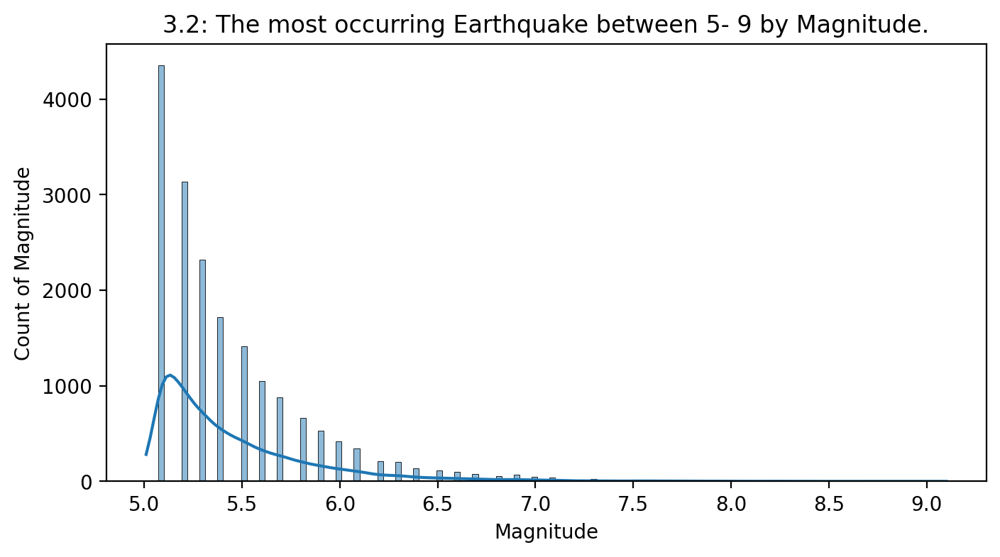

In [20]:

fig = plt.figure(figsize=(8,4), dpi = 200)
sns.histplot(data=earthquake_data, x="magnitude", kde=True)
plt.title('3.2: The most occurring Earthquake between 5- 9 by Magnitude.')
plt.xlabel('Magnitude')
plt.ylabel('Count of Magnitude')
plt.show()
fig.savefig('2.png', dpi =fig.dpi)

## 3.3: Number of Seismic Stations that captured the seismic event.

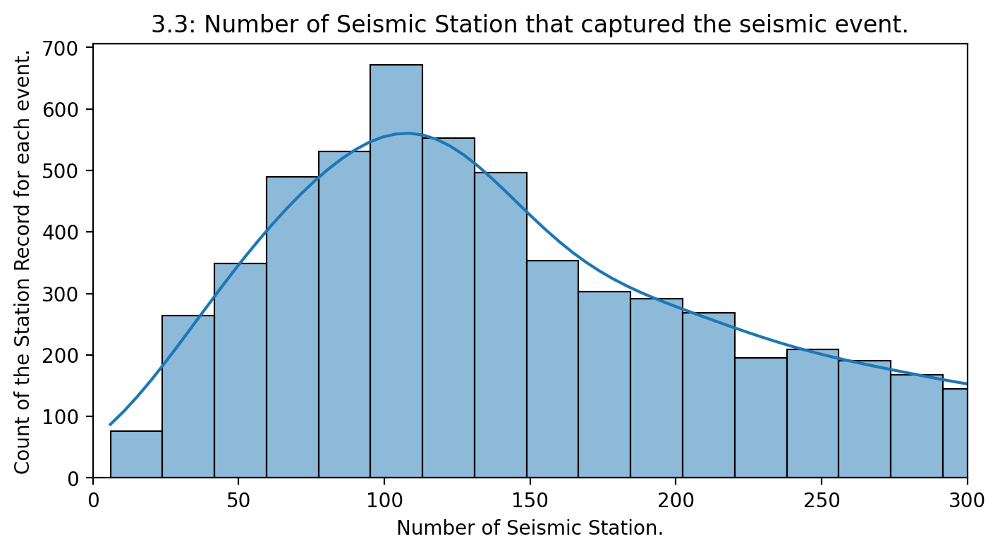

In [21]:
fig = plt.figure(figsize=(8,4), dpi = 200)
sns.histplot(data = earthquake_data, x = 'nst',kde = True)
plt.xlim(0,300)
plt.title('3.3: Number of Seismic Station that captured the seismic event.')
plt.xlabel('Number of Seismic Station.')
plt.ylabel('Count of the Station Record for each event.')
plt.show()
fig.savefig('3.png', dpi =fig.dpi)

## 3.4: The most occurring Earthquake type Counts form year 2011-2023

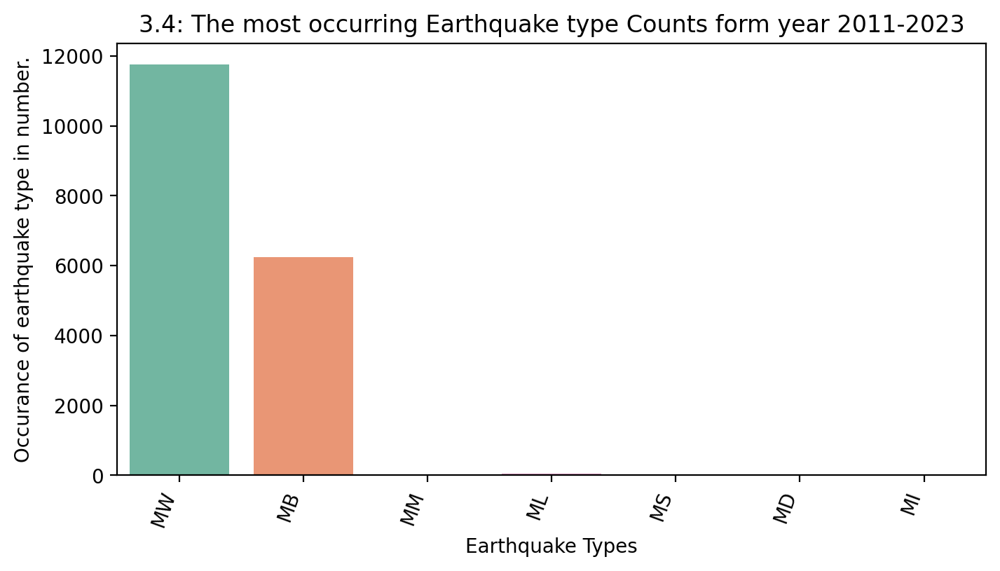

In [22]:
#The most occurring earthquake type is mb (body wave magnitude) type. and it is recorded more that 80% of time.
fig = plt.figure(figsize=(8,4), dpi = 200)
sns.countplot(data = mag_typ_df, x = 'magnitude_type', palette = 'Set2')
plt.title('3.4: The most occurring Earthquake type Counts form year 2011-2023')
plt.xlabel('Earthquake Types')
plt.ylabel('Occurance of earthquake type in number.')
plt.xticks(rotation=70, ha='right')
plt.show()
fig.savefig('4', dpi =fig.dpi)

## 3.5: The most occurring Earthquake type Counts form year 2013.

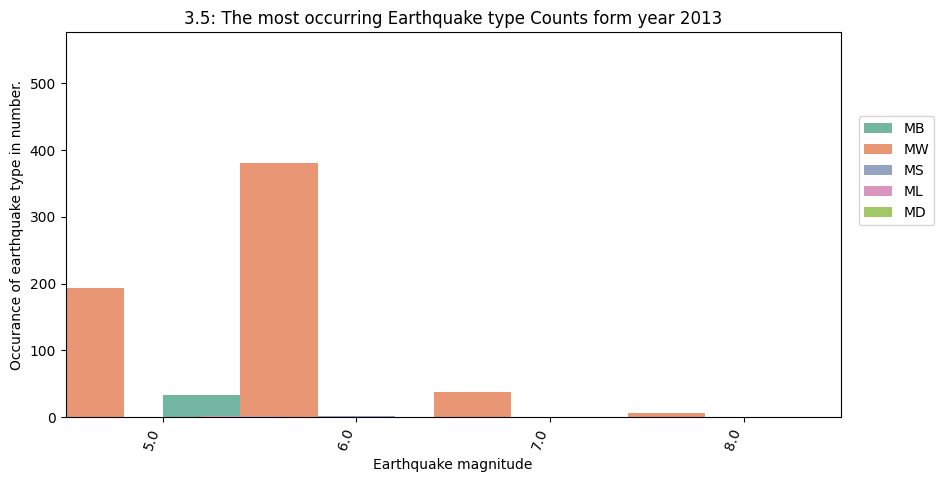

In [23]:
## Let's visualize the Earthquakes by Magnitude, to understand it in a better way
# rounding up the decimals of size to 0 because it has 2 which is creating lots of unique values and found hard to plot without using round function from numpy 
eq_2013 = year_data(2013, mag_typ_df)
eq_2013['magnitude'] = np.round(eq_2013['magnitude'],  decimals=0)

fig = plt.figure(figsize=(10, 5))
sns.countplot(data=eq_2013, x = 'magnitude', hue='magnitude_type', width=2, palette='Set2')
plt.legend(bbox_to_anchor=(1.13, 0.8))
plt.title('3.5: The most occurring Earthquake type Counts form year 2013')
plt.xlabel('Earthquake magnitude')
plt.ylabel('Occurance of earthquake type in number.')
plt.xticks(rotation=70, ha='right')
plt.show()
fig.savefig('five')
fig.savefig('5', dpi =fig.dpi)

#### The count plot shows that earthquakes within the magnitude range of 4 to 5 occur frequently, whereas those smaller than magnitude 4 or larger than magnitude 5 are relatively less common.

## 3.6: A kernel density estimate of magnitude, depth, distance by using pair plot and kind kde. 

In [35]:
# There are a large set of labels in the dataset, so im taking data for one year from 2011-2024, for that 2017 year is selected. 
eq_2017 = year_data(2017, mag_typ_df)
eq_2017

,date_time,latitude,longitude,depth,magnitude,magnitude_type,nst,gap,depth_min,rms,...,distance,url,gravity,force,year,month,day,hour,minutes,day_name
8335,2017-01-01 14:12:05,3.6359,128.5907,11.00,5.2,MW,NaN,95.0,3.096,0.70,...,389282,https://geodesy.noaa.gov/api/gravd/gp?lat=3.63...,9.798727,2.157796e-15,2017,1,1,14,1,Sunday
8336,2017-01-01 14:13:34,3.5887,128.2355,10.00,5.3,MW,NaN,56.0,5.364,0.61,...,389278,https://geodesy.noaa.gov/api/gravd/gp?lat=3.58...,9.779931,2.157840e-15,2017,1,1,14,1,Sunday
8337,2017-01-02 00:13:06,-36.0365,51.9288,10.00,5.7,MW,NaN,26.0,14.685,1.37,...,387822,https://geodesy.noaa.gov/api/gravd/gp?lat=-36....,9.780305,2.174073e-15,2017,1,2,0,2,Monday
8338,2017-01-02 03:21:37,-10.7398,162.0523,50.72,5.1,MB,NaN,60.0,2.442,0.90,...,387358,https://geodesy.noaa.gov/api/gravd/gp?lat=-10....,9.781776,2.179285e-15,2017,1,2,3,2,Monday
8339,2017-01-02 10:15:15,-23.2769,179.2614,547.77,5.3,MB,NaN,32.0,5.619,1.12,...,386330,https://geodesy.noaa.gov/api/gravd/gp?lat=-23....,9.785270,2.190898e-15,2017,1,2,10,2,Monday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9495,2017-12-30 08:20:51,-19.3429,-69.4283,103.33,5.2,MW,NaN,95.0,0.392,1.03,...,362794,https://geodesy.noaa.gov/api/gravd/gp?lat=-19....,9.786354,2.484385e-15,2017,12,30,8,30,Saturday
9496,2017-12-31 14:51:58,-11.8634,165.4973,9.55,5.1,MB,NaN,74.0,5.963,1.03,...,358228,https://geodesy.noaa.gov/api/gravd/gp?lat=-11....,9.813201,2.548120e-15,2017,12,31,14,31,Sunday
9497,2017-12-31 14:53:31,5.4949,124.9006,30.80,5.1,MW,NaN,60.0,1.703,1.01,...,358225,https://geodesy.noaa.gov/api/gravd/gp?lat=5.49...,9.780930,2.548163e-15,2017,12,31,14,31,Sunday
9498,2017-12-31 20:27:49,-8.1161,68.0644,10.00,5.1,MW,NaN,59.0,12.965,0.72,...,357688,https://geodesy.noaa.gov/api/gravd/gp?lat=-8.1...,9.781063,2.555820e-15,2017,12,31,20,31,Sunday


<Figure size 3000x3000 with 0 Axes>

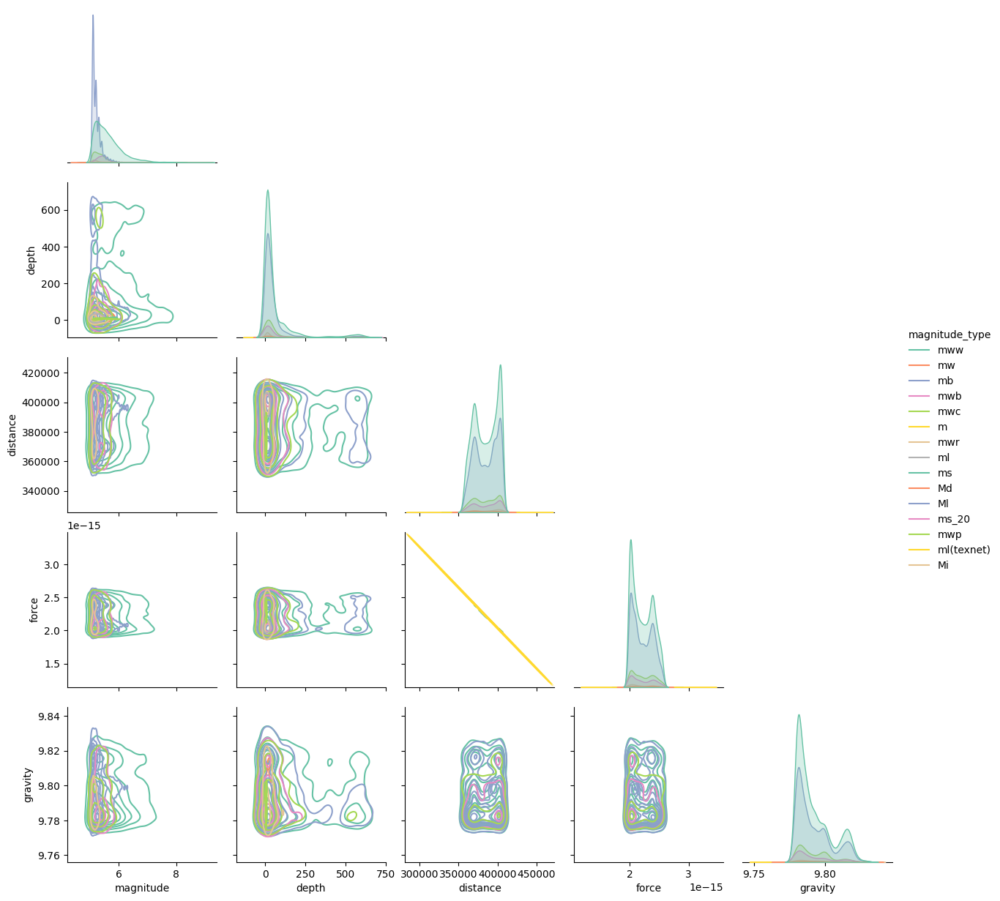

In [40]:
# for pairplot dataset
eq_2017['magnitude'] = np.round(eq_2017['magnitude'], decimals = 0)

# A kernel density estimate of magnitude, depth, distance by using pair plot and kind kde. 

fig = plt.figure(figsize=(15, 15), dpi = 200)
sns.pairplot(earthquake_data[['magnitude', 'depth', 'distance', 'magnitude_type', 'force', 'gravity']],
            palette='Set2',
            corner=True, 
            hue='magnitude_type',
            kind= 'kde')
# g.map_lower(sns.kdeplot, levels=4, color=".2")
plt.show()
fig.savefig('6.png', dpi =fig.dpi)

## 3.7: Days vs. Distance of the moon from the earth

In [ ]:
def months_df(year, df, month):
    data = year_data(year, df)
    return data[data['month'].isin([month])]
# entering the month for visualization of particular month

months_df(2015, earthquake_data, 4).head(2)

In [ ]:

eq_2015 = months_df(2015, earthquake_data, 7)

fig= plt.figure(figsize = (10,5), dpi = 200)
sns.scatterplot(x='distance', y='day',data=eq_2015, hue ='magnitude', palette = 'Set2')
plt.title('3.7: Day vs Distance of the moon from the earth')
plt.xlim(355000, 410000)
plt.legend(bbox_to_anchor=(1.12, 1.01), title='Magnitude' );
plt.show()
fig.savefig('7.png', dpi =fig.dpi)


## 3.8: Magnitude vs depth from range 0-700 km

In [ ]:
#loading data for year 2014
eq_2014 = year_data(2014, mag_typ_df)
# magnitude vs depth 
fig= plt.figure(figsize = (10,5), dpi = 200)

sns.scatterplot(data= eq_2014, x='magnitude', y ='depth', hue= 'magnitude_type', palette = 'Set2')
plt.legend(bbox_to_anchor=(1.11, 0.8), title='Magnitude Type' )
plt.title('3.8: magnitude vs depth from range 0-700 km')
plt.show()
fig.savefig('8.png', dpi =fig.dpi)

## 3.9 Earthquake by contribution in recording the events by the seismic stations location.
#### from the bar graph and pie chart, we can observe that 95 percentages of data are recorded in us the rest are recorded by two other stations. called us and pr.

In [ ]:
# from the bar graph and pie chart, we can observe that 95 percentages of data are recorded in us the rest are recorded by two other stations. called iscgemsup and iscgem. 
eq_2020 = year_data(2020, mag_typ_df)
net_list = ['net', 'us', 'pr', 'ak', 'hv', 'ci', 'nc', 'nn', 'tx', 'uu', 'aacse']
eq_2020 = eq_2020[eq_2020['net'].isin(net_list)]

plt.subplots(figsize=(15,5))

plt.style.use('ggplot')

                     
plt.subplot(1,2,1)
plt.title('3.9.1: Quakes by Data Contributor (net) (% Count)', fontsize=11)
my_xpl = np.round(np.linspace(0, 0.5, num=len(eq_2020['net'].unique())), decimals = 1)
eq_2020['net'].value_counts().plot(kind='pie', explode = my_xpl, legend=None, ylabel='',  counterclock=False, startangle=150, wedgeprops={'alpha':0.5, 'edgecolor' : '#000000','linewidth': 1, 'antialiased': True}, autopct='%1.1f')

plt.subplot(1,2,2)
plt.title('3.9.2: Quakes by Data Contributor (net) (Count)', fontsize=11)
ax = sns.countplot(x="net", data=eq_2020, alpha=0.5, order=eq_2020['net'].value_counts().index, palette = "Set2")
for p in ax.patches:
    ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+ p.get_width()/2, p.get_height() + 5), ha='center', va='bottom')
plt.yticks(rotation=40), plt.ylabel('Sumber of earthquake recorded by sesmic stations'), plt.xlabel(None, labelpad=0.1)
plt.xticks(rotation=90)
plt.show()


In [ ]:
# Taking earthquake data from 2015 april 24-27 because on days one of the highest earthquakes occurred in Nepal. To observe the distance of the moon during the earthquake events.
eq_2015_4 = months_df(2015, earthquake_data, 4)
eq_2015_4 = eq_2015_4[eq_2015_4['day'].between(21,30)]
eq_2015_4['magnitude'].count()


## 3.10: Earthquake from year 2015 april, day = 24-27

In [ ]:

fig= plt.figure(figsize = (10,5), dpi = 200)
sns.scatterplot( y= 'magnitude',
             x ='distance',
             data = eq_2015_4,
             color = 'b',
#              marker = 'o',
#              linestyle = 'solid',
#              mec='r',
                hue = 'magnitude_type',

            )
plt.title('3.10: Earthquake from year 2015 april, day = 24-27')
plt.ylabel('distance in thousand')
plt.xlabel('magnitude')

# plt.ylim(14500, 45000)
# plt.xlim(2011, 2024)
# plt.grid(visible=True, which='major', axis='both')
plt.tight_layout(pad=1.08);
fig.savefig('10.png', dpi =fig.dpi)

## 3.10: Number of earthquakes recorded each year through the world in a thousand.

In [ ]:
eq_mag6 = earthquake_data[earthquake_data['magnitude'].between(6,8)]
eq_mag6.head(2)

## 3.11 Earthquake magnitude between 6 - 8 with respect to distance for year 2011 to 2024

In [ ]:
fig= plt.figure(figsize = (10,5), dpi = 200)
sns.lineplot( x= 'magnitude', y='distance', data = earthquake_data, color = 'g', marker = 'o',mec='r', label='magnitude')

plt.title('3.11: Earthquake magnitude between 6 - 8 with respect to distance for year 2011 to 2024')
plt.ylabel('Counts in thousand from range 14500 to 45000')
plt.xlabel('Year from 2011 to 2023')
plt.axhline(y=eq_mag6['distance'].mean(), color='orange')
# plt.axhline(y=380000, color='g')
plt.grid(visible=None, which='major', axis='both')
plt.tight_layout(pad=1.08);
fig.savefig('11.png', dpi=fig.dpi)

## 3.12: The Earth's gravity and magnitude of the sesmic events
which indicate that the mosto of the major quakes occoured when earths gravity was less than average gravity 9.8

In [ ]:
earthquake_data['gravity'] = earthquake_data['gravity'].round(decimals =2)


In [ ]:
fig= plt.figure(figsize = (10,5), dpi = 200)
sns.lineplot( x= 'magnitude', y='gravity', data = earthquake_data, color = 'g', marker = 'o',mec='r', label='magnitude')

plt.title("3.12: The Earth's gravity and magnitude of the sesmic events")
plt.ylabel('earth gravity range form 9.78 to 9.82')
plt.xlabel('magnitude range form 2 to 9')
plt.axhline(y=9.8, color='orange')
plt.ylim(9.78, 9.83)
plt.tight_layout(pad=1.08);
fig.savefig('12.png', dpi=fig.dpi)

## 3.13: Force and magnitude

In [ ]:
 
fig= plt.figure(figsize = (10,5), dpi = 200)

sns.lineplot( x= 'magnitude', y='force', data = earthquake_data, color = 'g', marker = 'o',mec='r', label='magnitude')

plt.tight_layout(pad=1.08);
fig.savefig('13.png', dpi=fig.dpi)

plt.axhline(y=earthquake_data['force'].mean(), color='orange')
# ax[1].title.set_text('force and magnitude(6-9)')


plt.show()

In [ ]:
earthquake_data.columns

### droping columns and making df ready for feature engineering and training

In [25]:
#Removing unnecassary features for the trainging and testing dataset.
drop_list= ['nst', 'gap', 'depth_min', 'rms', 'net', 'id',
       'updated_date', 'place', 'type', 'horizontal_error', 'depth_error',
       'magnitude_error', 'magnitude_nst', 'status', 'location_source',
       'magnitude_source', 'url', 'year',
       'month', 'day', 'hour', 'minutes', 'day_name']
df = earthquake_data.drop(columns=drop_list, axis=1)
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 18059 entries, 0 to 18058
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   date_time       18059 non-null  datetime64[ns]
 1   latitude        18059 non-null  float64       
 2   longitude       18059 non-null  float64       
 3   depth           18059 non-null  float64       
 4   magnitude       18059 non-null  float64       
 5   magnitude_type  18059 non-null  object        
 6   distance        18059 non-null  int64         
 7   gravity         18059 non-null  float64       
 8   force           18059 non-null  float64       
dtypes: datetime64[ns](1), float64(6), int64(1), object(1)
memory usage: 1.4+ MB


### 3d map between distance, depth, magnitude

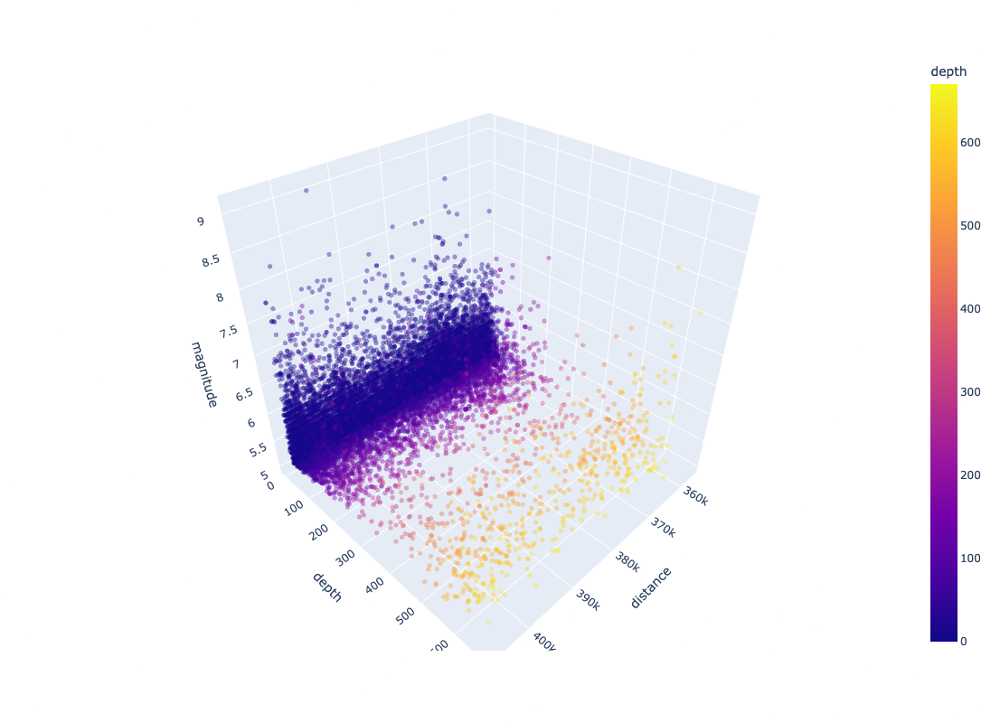

<Figure size 1280x960 with 0 Axes>

In [26]:


fig = plt.figure(dpi = 200)
fig = px.scatter_3d(df,
    x='distance',
    y='depth',
    z='magnitude',
    color='depth',
    opacity=0.4,
    color_discrete_sequence=px.colors.qualitative.Plotly
)

fig.update_layout( width=900, height=800)
fig.update_traces(marker=dict(size=3))
fig.show()

### 3d map between force, magintude, gravity

In [27]:



fig = plt.figure(dpi = 200)
fig = px.scatter_3d(df,
    x='force',
    y='magnitude',
    z='gravity',
    color='force',
    opacity=0.4,
    color_discrete_sequence=px.colors.qualitative.Plotly
)

fig.update_layout( width=900, height=800)
fig.update_traces(marker=dict(size=3))
fig.show()

<Figure size 1280x960 with 0 Axes>

In [28]:
### 3d plot between force, magnitude, gravity

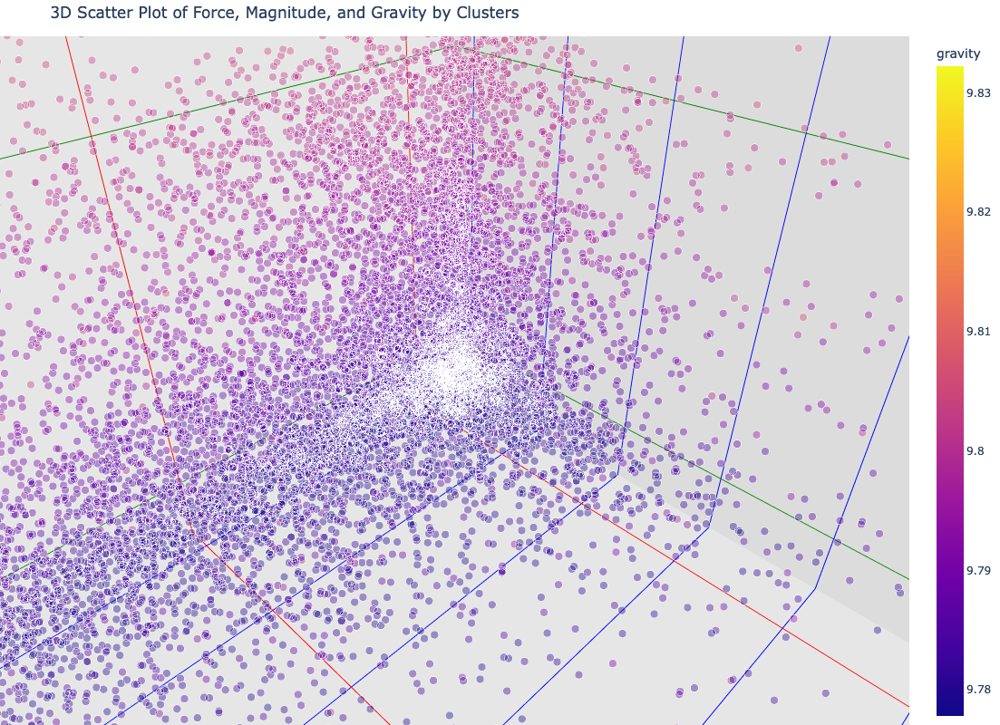

In [29]:
# Create the 3D scatter plot with clusters
fig = px.scatter_3d(df,
                    x='force',
                    y='magnitude',
                    z='gravity',
                    color='gravity',
                    opacity=0.4,
                    color_discrete_sequence=px.colors.qualitative.Plotly
                    )  # Use a discrete color sequence

fig.update_layout(
    width=1000, 
    height=800,
    title='3D Scatter Plot of Force, Magnitude, and Gravity by Clusters',
    scene=dict(
        xaxis=dict(title='Force', backgroundcolor="rgb(220, 220,220)", gridcolor="red", showbackground=True, zerolinecolor="red"),
        yaxis=dict(title='Magnitude', backgroundcolor="rgb(230, 230,230)", gridcolor="blue", showbackground=True, zerolinecolor="blue"),
        zaxis=dict(title='Gravity', backgroundcolor="rgb(230, 230,230)", gridcolor="green", showbackground=True, zerolinecolor="green"),
    ),
    margin=dict(l=0, r=0, b=0, t=40)
)

# Update marker properties
fig.update_traces(marker=dict(size=5, line=dict(width=2, color='DarkSlateGrey')))

fig.show()

## 3.12 Correlation matrix, which shows relation between the features.

In [31]:
# after visualization saving the dataset in cvs format for feature engineering and model training

In [ ]:
# df.to_csv('../dataset/final_dataset/trn_tst.csv', index = False)